In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import random
from PIL import Image
import time
import datetime

import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.losses import mean_squared_error
from tensorflow.keras.optimizers import Adam

import os
from glob import glob
from pathlib import Path
from collections import defaultdict
from pprint import pprint
from random import choice, sample
import cv2
from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive
drive.mount('/gdrive') 

Mounted at /gdrive


In [3]:
def load_image(img_path):
    img = tf.io.read_file(img_path) # returns string type tensor.
    img = tf.io.decode_jpeg(img, channels = 3)
    img = tf.image.resize(img, size = (384, 384), antialias = True)
    img = img / 255.0
    return img

In [4]:
# function to get the path of individual image.

def data_path(orig_img_path, hazy_img_path):
    
    train_img = []
    val_img = []
    
    orig_img = glob.glob(orig_img_path + '/*.jpg')
    n = len(orig_img)
    random.shuffle(orig_img)
    train_keys = orig_img[:int(0.9*n)]        #90% data for train, 10% for test
    val_keys = orig_img[int(0.9*n):]
    
    split_dict = {}
    for key in train_keys:
        split_dict[key] = 'train'
    for key in val_keys:
        split_dict[key] = 'val'
        
    hazy_img = glob.glob(hazy_img_path + '/*.jpg')
    for img in hazy_img:
        img_name = img.split('/')[-1]
        orig_path = orig_img_path + '/' + img_name.split('_')[0]
        if (split_dict[orig_path] == 'train'):
            train_img.append([img, orig_path])
        else:
            val_img.append([img, orig_path])
            
    return train_img, val_img

In [5]:
def get_hazy_image(img_path):
  img = cv2.imread(img_path)
  cropped_image = img[:int(img.shape[0]/2)]
  return cropped_image

In [6]:
def get_clean_image(img_path):
  img = cv2.imread(img_path)
  cropped_image = img[int(img.shape[0]/2):]
  return cropped_image

In [7]:
# path = '/gdrive/MyDrive/Deep Learning Competition/train/haze_images/002.jpg'
# haze = get_hazy_image(path)
# cv2_imshow(haze)

# clean = get_clean_image(path)
# cv2_imshow(clean)
# print(clean.shape)
# print(haze.shape)

In [8]:
### Preprocess: Creating Haze and Clear images directories

In [17]:
all_images = '/gdrive/MyDrive/Deep Learning Competition/train/haze_images/'
root = '/gdrive/MyDrive/Deep Learning Competition/'

In [9]:
# input_haze = os.path.join(root, 'input_haze')
# input_clear = os.path.join(root, 'input_clear')
# Path(input_haze).mkdir(parents=True, exist_ok=True)
# Path(input_clear).mkdir(parents=True, exist_ok=True)

# all_input_images = glob(all_images + "/*.jpg")


# clean_images = []
# haze_images = []
# i = 0
# for image in all_input_images:
#   clear_image = get_clean_image(image)
#   haze_image = get_hazy_image(image)
#   prefix = str(Path(image).stem)
#   clear_image_path = "clear" + prefix + ".jpg"
#   haze_image_path = "haze" + prefix + ".jpg"

#   clear_image_file = os.path.join(input_clear, f'{clear_image_path}')
#   haze_image_file = os.path.join(input_haze, f'{haze_image_path}')

#   cv2.imwrite(clear_image_file, clear_image) 
#   cv2.imwrite(haze_image_file, haze_image) 



In [10]:
# function to load the image in the form of tensors.

def load_image(img_path):
    img = tf.io.read_file(img_path)
    img = tf.io.decode_jpeg(img, channels = 3)
    img = tf.image.resize(img, size = (412, 548), antialias = True)
    img = img / 255.0
    return img

In [11]:
# function to get the path of individual image.

def data_path(orig_img_path, hazy_img_path):
    
    train_img = []
    val_img = []
    
    orig_img = glob.glob(orig_img_path + '/*.jpg')
    n = len(orig_img)
    random.shuffle(orig_img)
    train_keys = orig_img[:int(0.9*n)]        #90% data for train, 10% for test
    val_keys = orig_img[int(0.9*n):]
    
    split_dict = {}
    for key in train_keys:
        split_dict[key] = 'train'
    for key in val_keys:
        split_dict[key] = 'val'
        
    hazy_img = glob.glob(hazy_img_path + '/*.jpg')
    for img in hazy_img:
        img_name = img.split('/')[-1]
        orig_path = orig_img_path + '/' + "clear" + img_name.split('.')[0][-3:] + ".jpg"
        if (split_dict[orig_path] == 'train'):
            train_img.append([img, orig_path])
        else:
            val_img.append([img, orig_path])
            
    return train_img, val_img

In [12]:
# function to load tensor image data in batches.

def dataloader(train_data, val_data, batch_size):
    
    train_data_orig = tf.data.Dataset.from_tensor_slices([img[1] for img in train_data]).map(lambda x: load_image(x))
    train_data_haze = tf.data.Dataset.from_tensor_slices([img[0] for img in train_data]).map(lambda x: load_image(x))
    train = tf.data.Dataset.zip((train_data_haze, train_data_orig)).shuffle(buffer_size=100).batch(batch_size)
    
    val_data_orig = tf.data.Dataset.from_tensor_slices([img[1] for img in val_data]).map(lambda x: load_image(x))
    val_data_haze = tf.data.Dataset.from_tensor_slices([img[0] for img in val_data]).map(lambda x: load_image(x))
    val = tf.data.Dataset.zip((val_data_haze, val_data_orig)).shuffle(buffer_size=100).batch(batch_size)
    
    return train, val

In [13]:
# function to display output.

def display_img(model, hazy_img, orig_img):
    
    dehazed_img = model(hazy_img, training = True)
    plt.figure(figsize = (15,15))
    
    display_list = [hazy_img[0], orig_img[0], dehazed_img[0]]
    title = ['Hazy Image', 'Ground Truth', 'Dehazed Image']
    
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
        
    plt.show()

In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import random
from PIL import Image
import time
import datetime

import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.losses import mean_squared_error
from tensorflow.keras.optimizers import Adam

In [15]:
def gman_net():
    
    inputs = tf.keras.Input(shape = [412, 548, 3])     # height, width of input image changed because of error in output
    
                                    ######################## GMAN Network ###########################
        
    conv = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                  bias_initializer = b_init, kernel_regularizer = regularizer)(inputs)
    conv = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                  bias_initializer = b_init, kernel_regularizer = regularizer)(conv)
    
    
                                    #### Encoding Layers #####
    conv_up = Conv2D(filters = 128, kernel_size = 3, strides = 2, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv)
    conv_up = Conv2D(filters = 128, kernel_size = 3, strides = 2, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv_up)
                                    
                                    #### Residual Layers #####
    conv1_1 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                   bias_initializer = b_init, kernel_regularizer = regularizer)(conv_up)
    conv1_2 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv1_1)
    conv1_3 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                   bias_initializer = b_init, kernel_regularizer = regularizer)(conv1_2)
    conc1 = tf.add(conv1_3, conv1_1)
    conv1 = tf.keras.activations.relu(conc1)

    conv2_1 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv1)
    conv2_2 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv2_1)
    conv2_3 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv2_2)
    conc2 = tf.add(conv2_3, conv2_1)
    conv2 = tf.keras.activations.relu(conc2)

    conv3_1 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv2)
    conv3_2 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv3_1)
    conv3_3 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv3_2)
    conv3_4 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv3_3)
    conv3_5 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv3_4)
    conc3 = tf.add(conv3_5, conv3_1)
    conv3 = tf.keras.activations.relu(conc3)

    conv4_1 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv3)
    conv4_2 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv4_1)
    conv4_3 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv4_2)
    conv4_4 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv4_3)
    conv4_5 = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                     bias_initializer = b_init, kernel_regularizer = regularizer)(conv4_4)
    conc4 = tf.add(conv4_5, conv4_1)
    conv4 = tf.keras.activations.relu(conc4)

                                            ##### Decoding Layers #####
    deconv = Conv2DTranspose(filters = 64, kernel_size = 3, strides = 2, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                             kernel_regularizer = regularizer)(conv4)
    deconv = Conv2DTranspose(filters = 64, kernel_size = 3, strides = 2, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                             kernel_regularizer = regularizer)(deconv)

    conv = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                  bias_initializer = b_init, kernel_regularizer = regularizer)(deconv)
    conv = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                  bias_initializer = b_init, kernel_regularizer = regularizer)(conv)
    conc = tf.add(conv, inputs)
    gman_output = tf.keras.activations.relu(conc)
    
                               ######################## Parallel Network ###########################
    
    conv = Conv2D(filters = 64, kernel_size = 3, dilation_rate = 4, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                 kernel_regularizer = regularizer)(inputs)
    conv = Conv2D(filters = 64, kernel_size = 3, dilation_rate = 2, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                 kernel_regularizer = regularizer)(conv)
    conv = Conv2D(filters = 64, kernel_size = 3, dilation_rate = 2, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                 kernel_regularizer = regularizer)(conv)
    conv = Conv2D(filters = 64, kernel_size = 3, dilation_rate = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                 kernel_regularizer = regularizer)(conv)
    conv = Conv2D(filters = 64, kernel_size = 3, dilation_rate = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                 kernel_regularizer = regularizer)(conv)
    conv = Conv2D(filters = 64, kernel_size = 3, dilation_rate = 1, padding = 'same', kernel_initializer = k_init, activation = 'relu',
                 kernel_regularizer = regularizer)(conv)
    deconv = Conv2DTranspose(filters = 64, kernel_size = 3, dilation_rate = 4, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                           activation = 'relu', kernel_regularizer = regularizer)(conv)
    conv = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', kernel_initializer = tf.keras.initializers.glorot_normal(seed = 101),
                 kernel_regularizer = regularizer)(deconv)
    conc = tf.add(conv, inputs)
    pn_output = tf.keras.activations.relu(conc)
    
    output = tf.add(gman_output, pn_output)
    
    return Model(inputs = inputs, outputs = output)

In [18]:
input_haze = os.path.join(root, 'input_haze')
input_clear = os.path.join(root, 'input_clear')

In [28]:
# Hyperparameters
epochs = 50
batch_size = 8
k_init = tf.keras.initializers.random_normal(stddev=0.008, seed = 101)      
regularizer = tf.keras.regularizers.L2(1e-4)
b_init = tf.constant_initializer()

train_data, val_data = data_path(orig_img_path = input_clear, hazy_img_path = input_haze)
train, val = dataloader(train_data, val_data, batch_size)

optimizer = Adam(learning_rate = 1e-4)
net = gman_net()

train_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "train loss")
val_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "val loss")

In [29]:
def train_model(epochs, train, val, net, train_loss_tracker, val_loss_tracker, optimizer):
    
    for epoch in range(epochs):
        
        print("\nStart of epoch %d" % (epoch,), end=' ')
        start_time_epoch = time.time()
        start_time_step = time.time()
        
        # training loop
        
        for step, (train_batch_haze, train_batch_orig) in enumerate(train):

            with tf.GradientTape() as tape:

                train_logits = net(train_batch_haze, training = True)
                loss = mean_squared_error(train_batch_orig, train_logits)

            grads = tape.gradient(loss, net.trainable_weights)
            optimizer.apply_gradients(zip(grads, net.trainable_weights))

            train_loss_tracker.update_state(train_batch_orig, train_logits)
            if step == 0:
                print('[', end='')
            if step % 64 == 0:
                print('=', end='')
        
        print(']', end='')
        print('  -  ', end='')
        print('Training Loss: %.4f' % (train_loss_tracker.result()), end='')
        
        # validation loop
        
        for step, (val_batch_haze, val_batch_orig) in enumerate(val):
            val_logits = net(val_batch_haze, training = False)
            val_loss_tracker.update_state(val_batch_orig, val_logits)
            
            if step % 32 ==0:
                display_img(net, val_batch_haze, val_batch_orig)
        
        print('  -  ', end='')
        print('Validation Loss: %.4f' % (val_loss_tracker.result()), end='')
        print('  -  ', end=' ')
        print("Time taken: %.2fs" % (time.time() - start_time_epoch))
        
        net.save('trained_model')           # save the model(variables, weights, etc)
        train_loss_tracker.reset_states()
        val_loss_tracker.reset_states()


Start of epoch 0 [=]  -  Training Loss: 0.3467

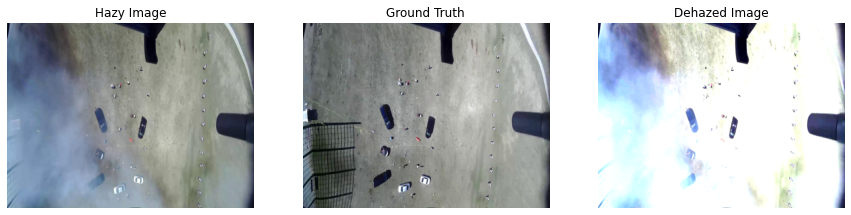

  -  Validation Loss: 0.3005  -   Time taken: 105.73s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 1 [=]  -  Training Loss: 0.1409

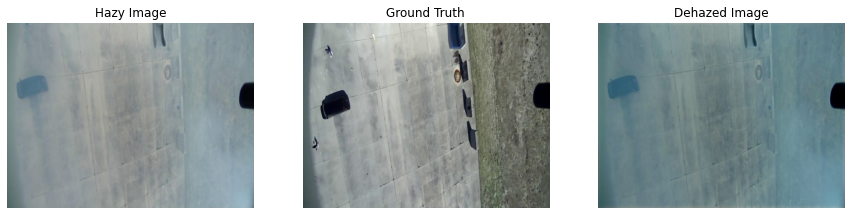

  -  Validation Loss: 0.0380  -   Time taken: 105.36s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 2 [=]  -  Training Loss: 0.0288

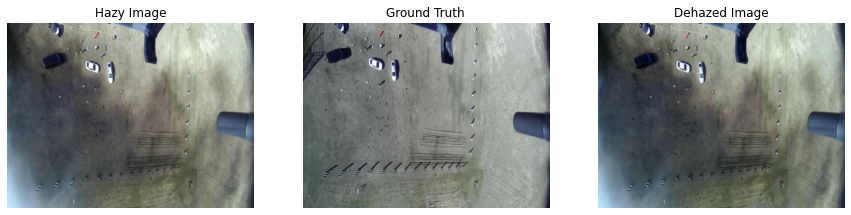

  -  Validation Loss: 0.0299  -   Time taken: 103.81s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 3 [=]  -  Training Loss: 0.0274

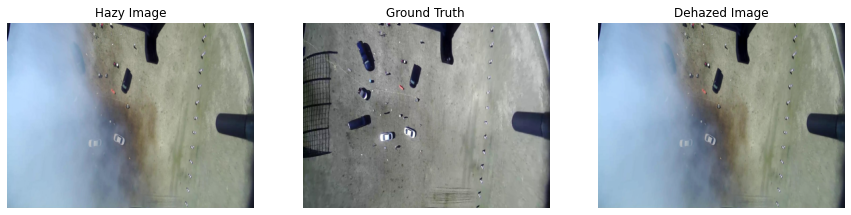

  -  Validation Loss: 0.0296  -   Time taken: 103.76s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 4 [=]  -  Training Loss: 0.0273

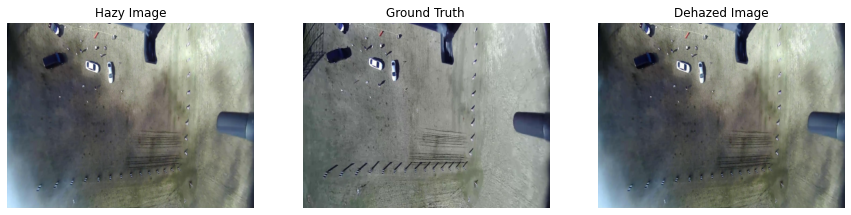

  -  Validation Loss: 0.0294  -   Time taken: 103.75s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 5 [=]  -  Training Loss: 0.0272

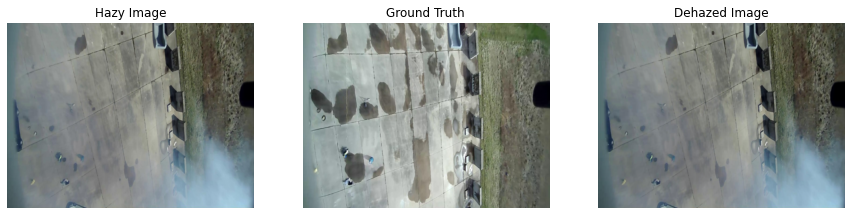

  -  Validation Loss: 0.0293  -   Time taken: 104.20s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 6 [=]  -  Training Loss: 0.0271

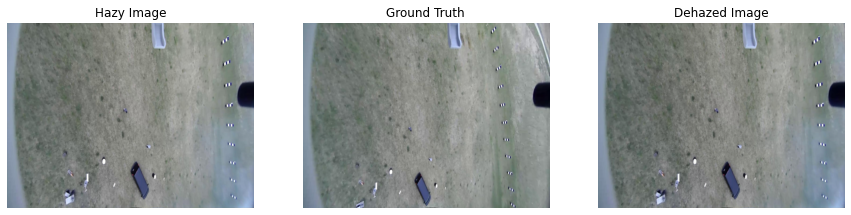

  -  Validation Loss: 0.0292  -   Time taken: 108.25s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 7 [=]  -  Training Loss: 0.0271

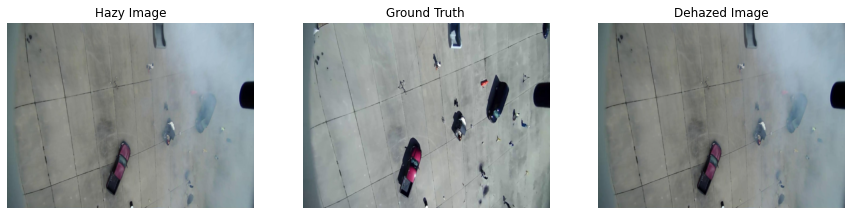

  -  Validation Loss: 0.0291  -   Time taken: 104.37s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 8 [=]  -  Training Loss: 0.0270

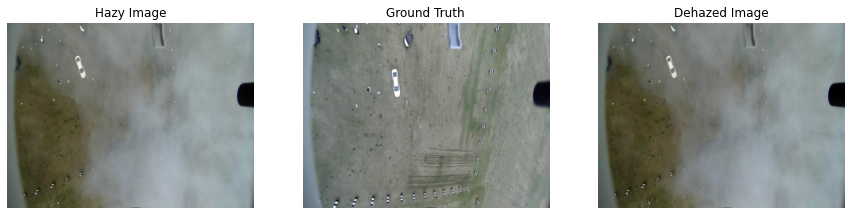

  -  Validation Loss: 0.0290  -   Time taken: 104.51s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 9 [=]  -  Training Loss: 0.0268

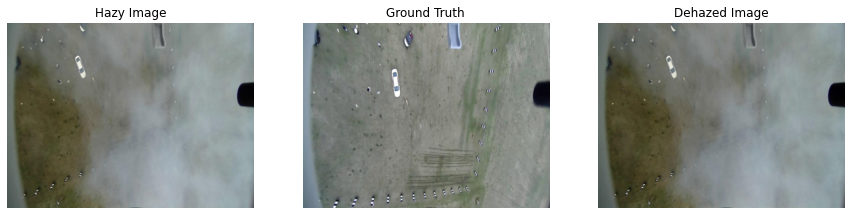

  -  Validation Loss: 0.0284  -   Time taken: 104.49s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 10 [=]  -  Training Loss: 0.0263

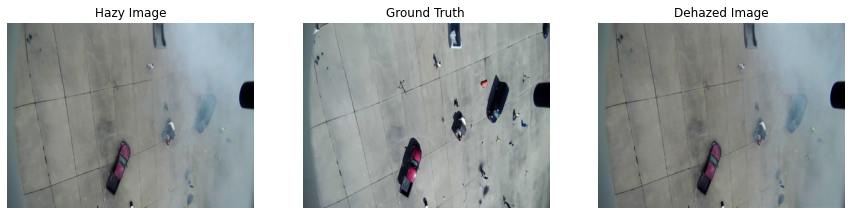

  -  Validation Loss: 0.0271  -   Time taken: 104.73s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 11 [=]  -  Training Loss: 0.0251

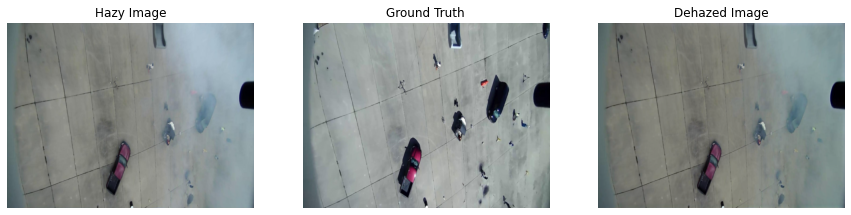

  -  Validation Loss: 0.0252  -   Time taken: 104.34s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 12 [=]  -  Training Loss: 0.0233

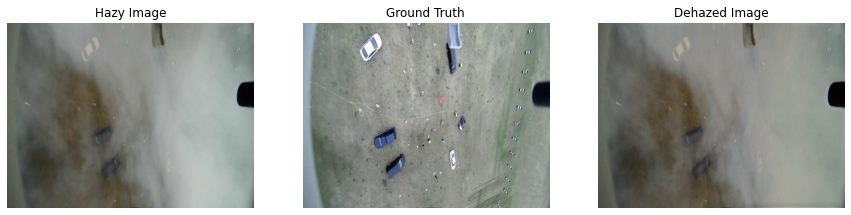

  -  Validation Loss: 0.0214  -   Time taken: 104.44s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 13 [=]  -  Training Loss: 0.0226

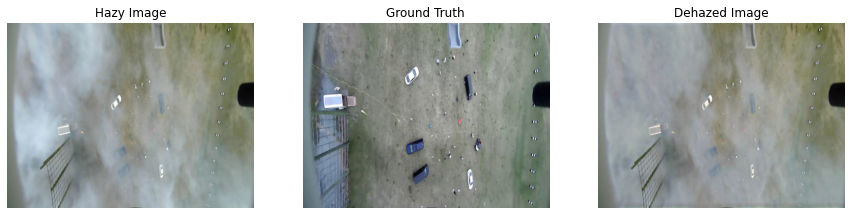

  -  Validation Loss: 0.0225  -   Time taken: 104.25s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 14 [=]  -  Training Loss: 0.0223

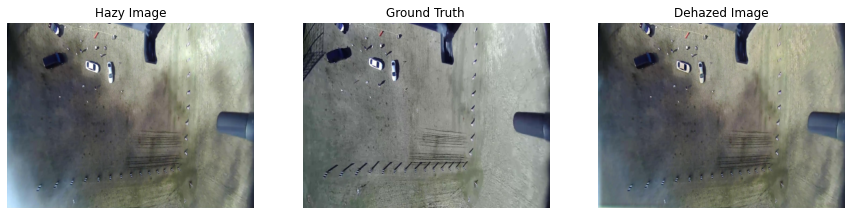

  -  Validation Loss: 0.0198  -   Time taken: 104.28s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 15 [=]  -  Training Loss: 0.0211

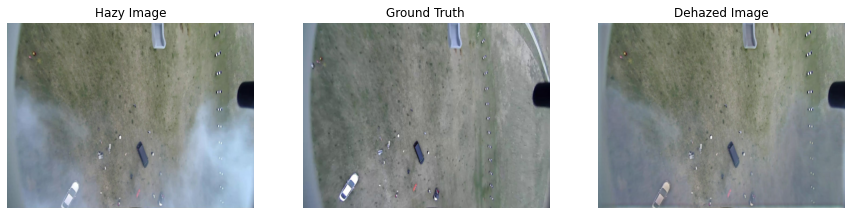

  -  Validation Loss: 0.0189  -   Time taken: 104.35s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 16 [=]  -  Training Loss: 0.0206

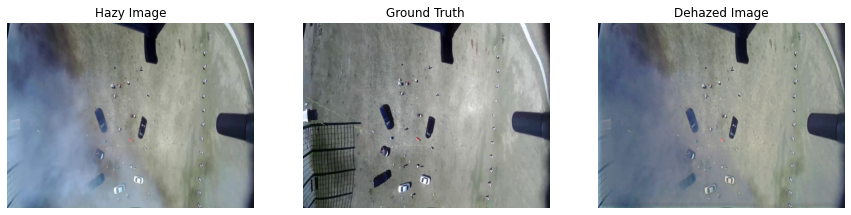

  -  Validation Loss: 0.0180  -   Time taken: 104.33s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 17 [=]  -  Training Loss: 0.0202

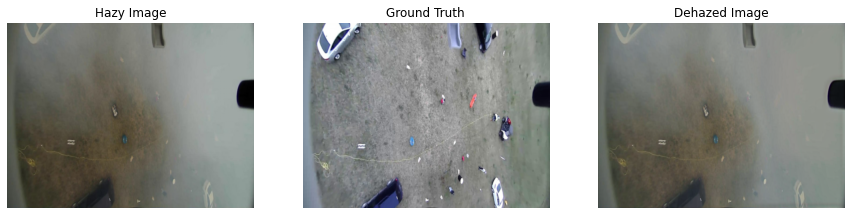

  -  Validation Loss: 0.0168  -   Time taken: 104.70s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 18 [=]  -  Training Loss: 0.0194

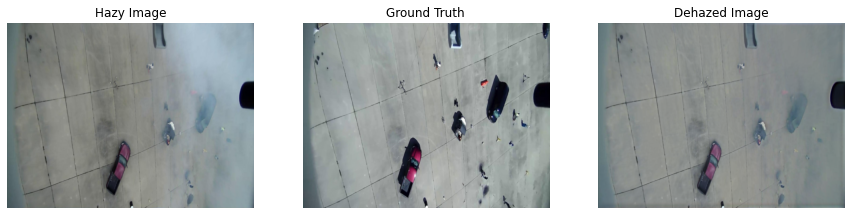

  -  Validation Loss: 0.0162  -   Time taken: 104.73s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 19 [=]  -  Training Loss: 0.0197

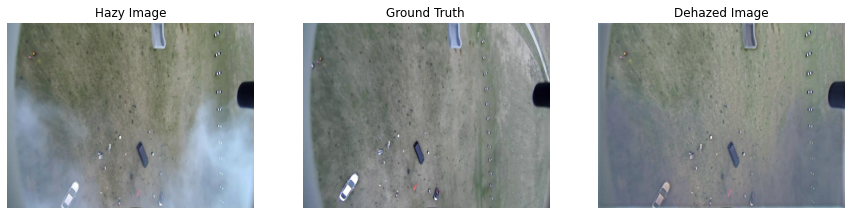

  -  Validation Loss: 0.0168  -   Time taken: 104.57s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 20 [=]  -  Training Loss: 0.0195

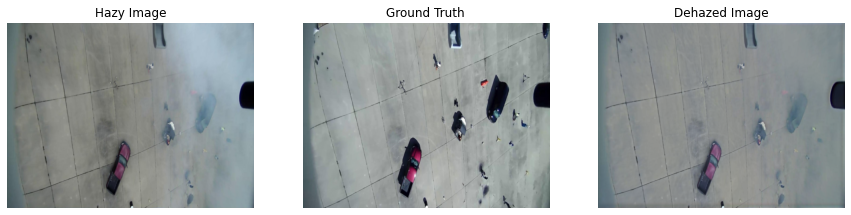

  -  Validation Loss: 0.0161  -   Time taken: 104.31s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 21 [=]  -  Training Loss: 0.0189

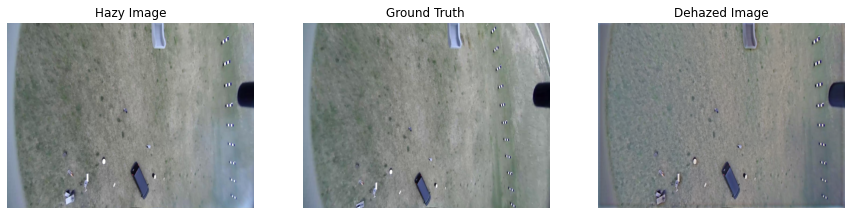

  -  Validation Loss: 0.0168  -   Time taken: 106.45s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 22 [=]  -  Training Loss: 0.0189

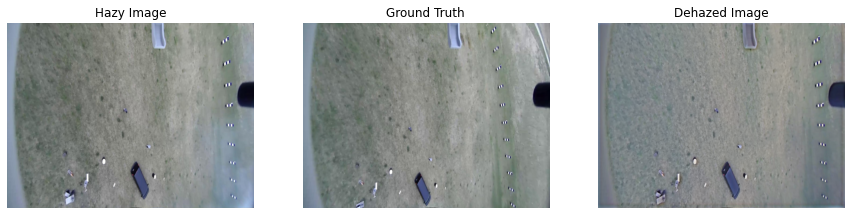

  -  Validation Loss: 0.0155  -   Time taken: 104.49s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 23 [=]  -  Training Loss: 0.0187

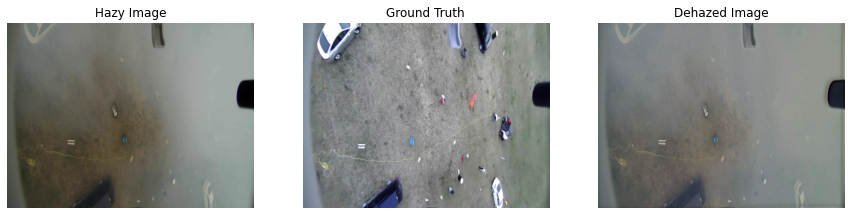

  -  Validation Loss: 0.0155  -   Time taken: 104.30s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 24 [=]  -  Training Loss: 0.0191

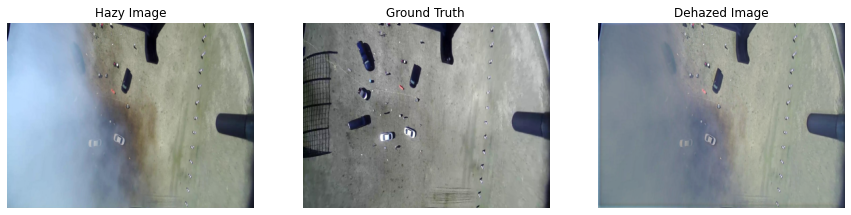

  -  Validation Loss: 0.0161  -   Time taken: 104.43s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 25 [=]  -  Training Loss: 0.0186

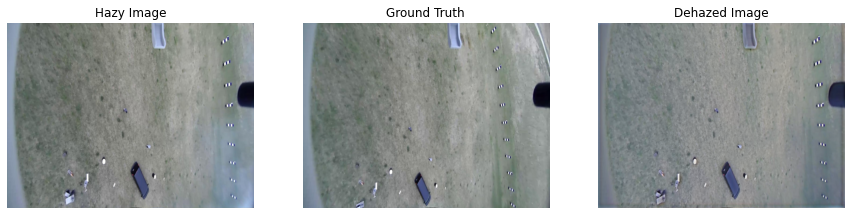

  -  Validation Loss: 0.0152  -   Time taken: 104.28s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 26 [=]  -  Training Loss: 0.0184

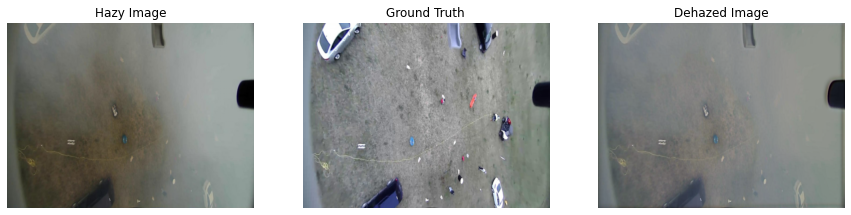

  -  Validation Loss: 0.0151  -   Time taken: 104.26s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 27 [=]  -  Training Loss: 0.0185

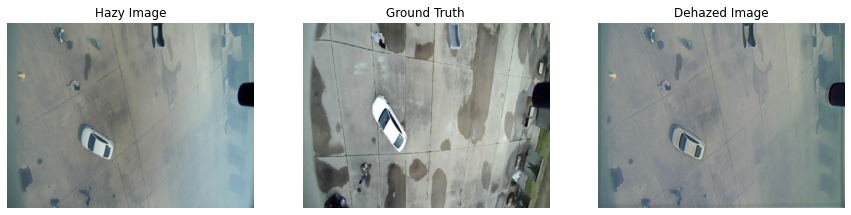

  -  Validation Loss: 0.0151  -   Time taken: 104.17s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 28 [=]  -  Training Loss: 0.0185

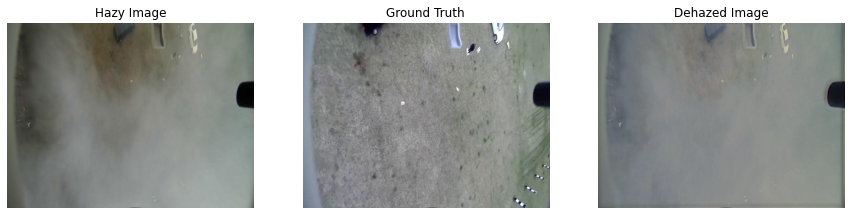

  -  Validation Loss: 0.0151  -   Time taken: 104.45s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 29 [=]  -  Training Loss: 0.0183

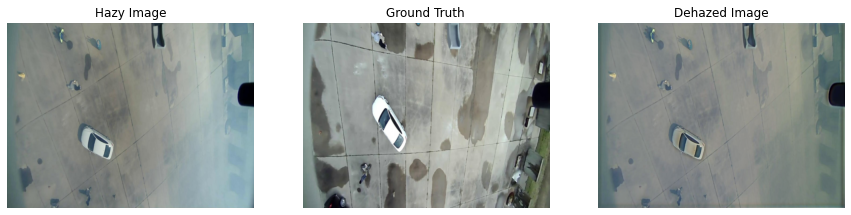

  -  Validation Loss: 0.0153  -   Time taken: 104.50s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 30 [=]  -  Training Loss: 0.0184

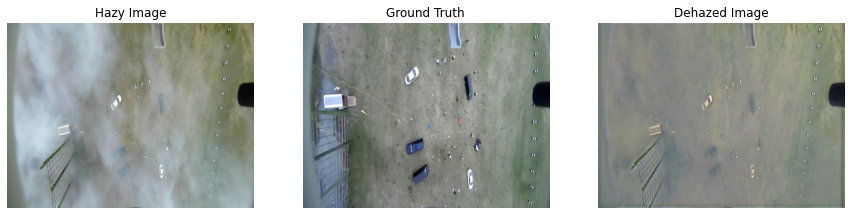

  -  Validation Loss: 0.0161  -   Time taken: 104.39s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 31 [=]  -  Training Loss: 0.0191

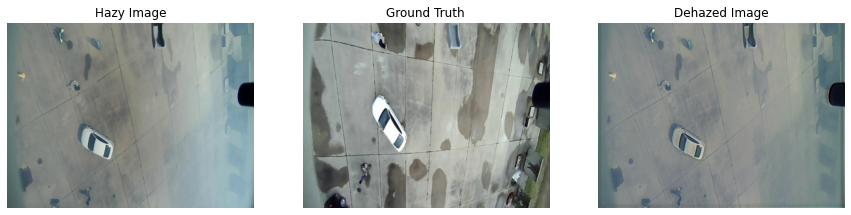

  -  Validation Loss: 0.0152  -   Time taken: 104.53s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 32 [=]  -  Training Loss: 0.0183

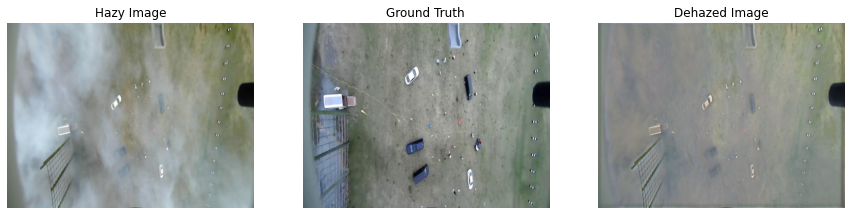

  -  Validation Loss: 0.0152  -   Time taken: 104.51s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 33 [=]  -  Training Loss: 0.0183

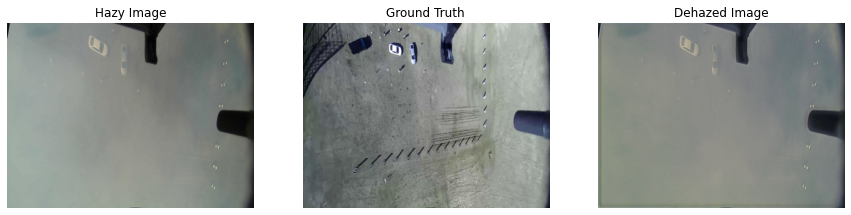

  -  Validation Loss: 0.0160  -   Time taken: 108.21s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 34 [=]  -  Training Loss: 0.0183

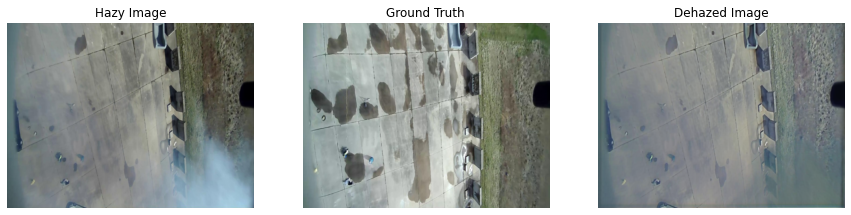

  -  Validation Loss: 0.0149  -   Time taken: 104.14s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 35 [=]  -  Training Loss: 0.0184

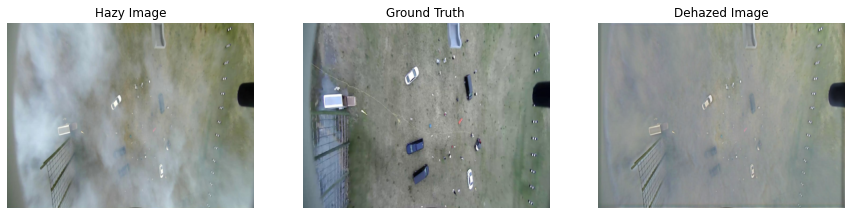

  -  Validation Loss: 0.0149  -   Time taken: 105.28s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 36 [=]  -  Training Loss: 0.0183

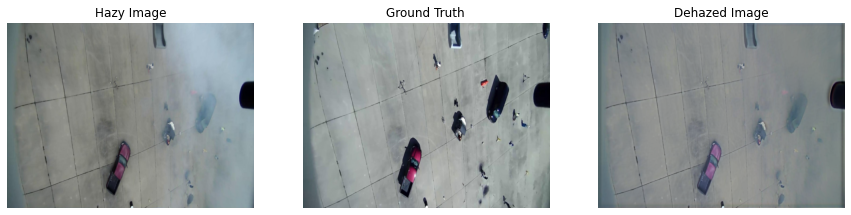

  -  Validation Loss: 0.0148  -   Time taken: 104.94s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 37 [=]  -  Training Loss: 0.0183

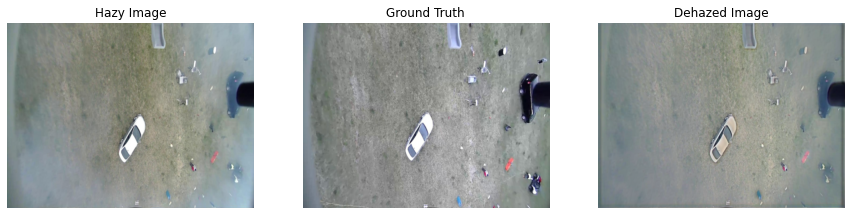

  -  Validation Loss: 0.0149  -   Time taken: 104.70s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 38 [=]  -  Training Loss: 0.0183

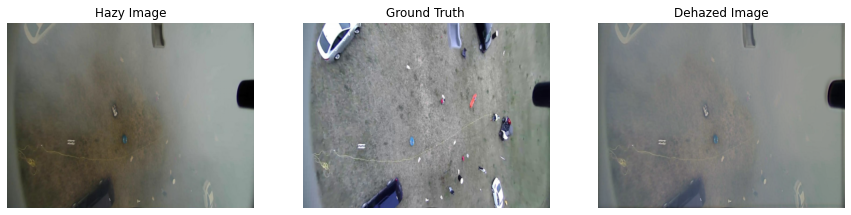

  -  Validation Loss: 0.0149  -   Time taken: 104.64s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 39 [=]  -  Training Loss: 0.0182

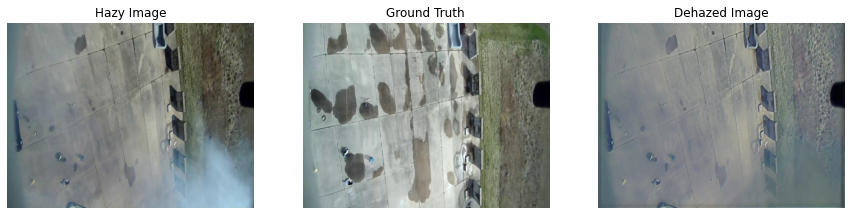

  -  Validation Loss: 0.0148  -   Time taken: 104.83s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 40 [=]  -  Training Loss: 0.0181

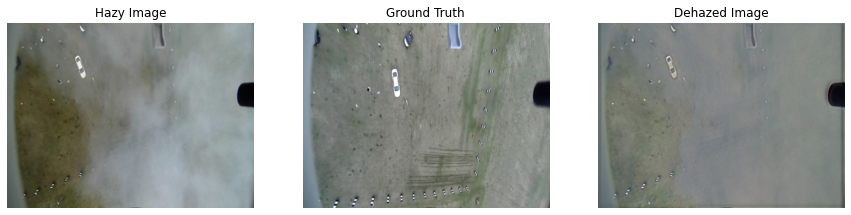

  -  Validation Loss: 0.0154  -   Time taken: 104.68s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 41 [=]  -  Training Loss: 0.0183

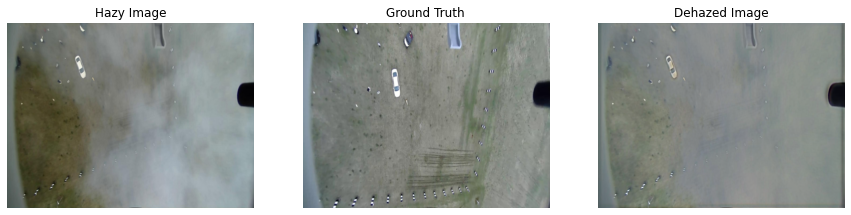

  -  Validation Loss: 0.0147  -   Time taken: 105.24s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 42 [=]  -  Training Loss: 0.0182

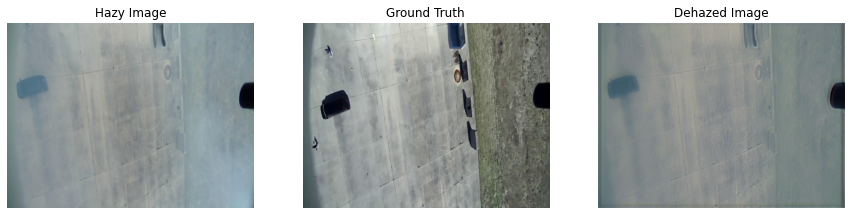

  -  Validation Loss: 0.0149  -   Time taken: 104.81s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 43 [=]  -  Training Loss: 0.0180

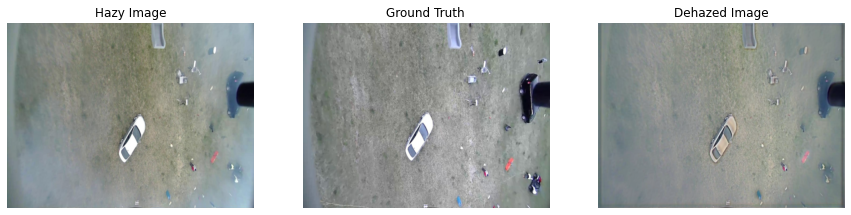

  -  Validation Loss: 0.0147  -   Time taken: 105.09s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 44 [=]  -  Training Loss: 0.0181

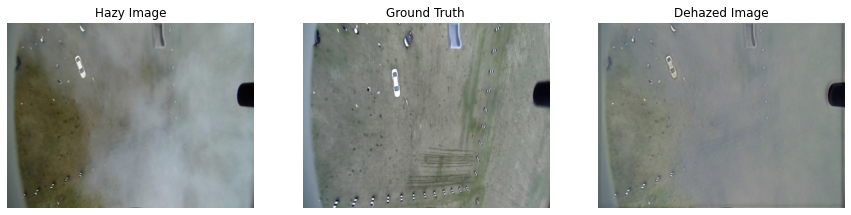

  -  Validation Loss: 0.0147  -   Time taken: 105.06s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 45 [=]  -  Training Loss: 0.0182

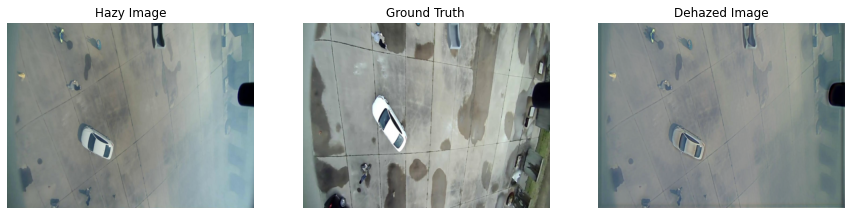

  -  Validation Loss: 0.0147  -   Time taken: 105.54s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 46 [=]  -  Training Loss: 0.0183

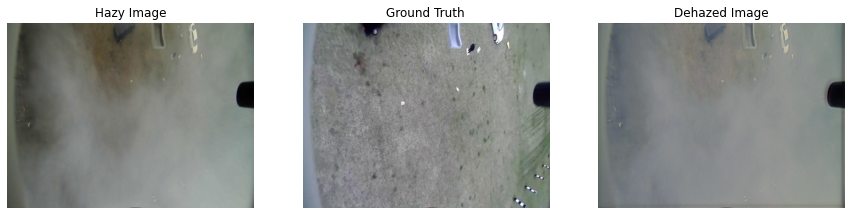

  -  Validation Loss: 0.0148  -   Time taken: 105.09s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 47 [=]  -  Training Loss: 0.0184

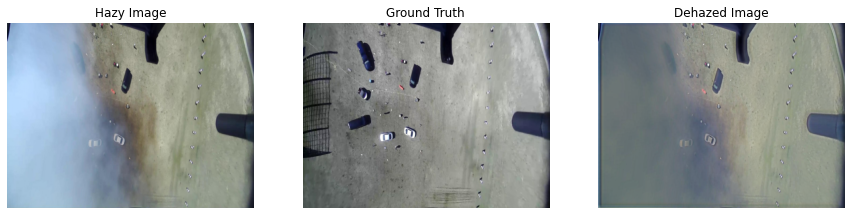

  -  Validation Loss: 0.0150  -   Time taken: 104.95s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 48 [=]  -  Training Loss: 0.0183

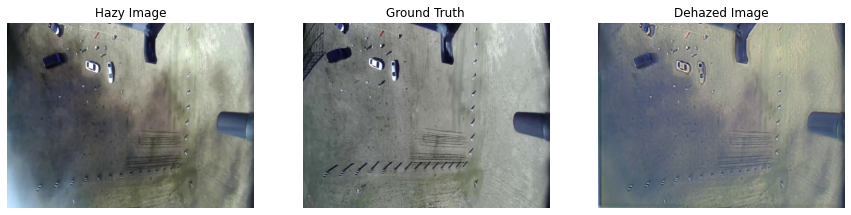

  -  Validation Loss: 0.0149  -   Time taken: 104.82s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets



Start of epoch 49 [=]  -  Training Loss: 0.0183

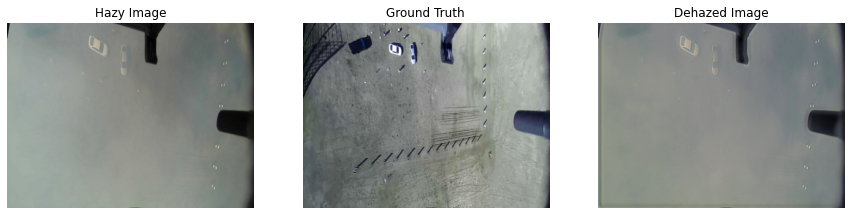

  -  Validation Loss: 0.0153  -   Time taken: 104.65s


INFO:tensorflow:Assets written to: trained_model/assets


INFO:tensorflow:Assets written to: trained_model/assets


CPU times: user 33min 45s, sys: 2min 10s, total: 35min 55s
Wall time: 1h 33min 10s


In [30]:
%%time
train_model(epochs, train, val, net, train_loss_tracker, val_loss_tracker, optimizer)

In [22]:
## Detecting objects

In [23]:
# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# Print Tensorflow version
print(tf.__version__)

2.8.0


In [24]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [31]:
def filter_coords(result, threshold = 0):
  '''
    A helper method which extracts the bounding boxes and threshold confidence scores
    from the data structure returned from the pretrained model

    Parameters:
            result : Output of the pretrained tensor flow model
            threshold : Optional threshold confidence above which bounding boxes are selected
    Returns:
            The list of coordinates of the detected objects and the threshold score
  '''
  class_entities = result['detection_class_entities']
  detection_scores = result['detection_scores']
  bounding_boxes = result['detection_boxes']
  detection_boxes_with_thresholds = []
  for class_entity, detection_score, bounding_box in zip(class_entities, detection_scores, bounding_boxes):
    if class_entity in [b'Vehicle', b'Car'] and detection_score > threshold:
      detection_boxes_with_thresholds.append((bounding_box, detection_score))
  return detection_boxes_with_thresholds

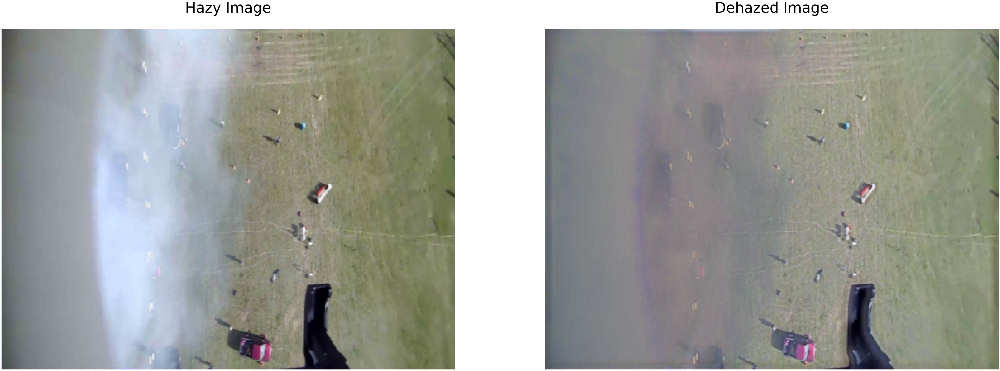

In [32]:
image_path = '/gdrive/MyDrive/2nd Semester/Coursework/Deep Learning/Competition/Submission Feb 20th Onwards/UG2+_Track1/train/dry-run-1/new_068.jpg'
img = tf.io.read_file(image_path)
img = tf.io.decode_jpeg(img, channels = 3)

if img.shape[1] > img.shape[0]:
    img = tf.image.resize(img, size = (548, 412), antialias = True)
if img.shape[1] < img.shape[0]:
    img = tf.image.resize(img, size = (412, 548), antialias = True)

img = img / 255
img = tf.expand_dims(img, axis = 0)      # transform input image from 3D to 4D

dehaze = net(img, training = False)

plt.figure(figsize = (80, 80))

display_list = [img[0], dehaze[0]]       # make the first dimension zero
title = ['Hazy Image', 'Dehazed Image']

for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i], fontsize = 65, y = 1.045)
    plt.imshow(display_list[i])
    plt.axis('off')

plt.show()

In [33]:
root

'/gdrive/MyDrive/Deep Learning Competition/'

In [41]:
from os import listdir
from os.path import isfile, join

dry_run_folder = os.path.join(root, 'new_dry_run/images')
dry_run_images = [join(dry_run_folder, f) for f in listdir(dry_run_folder) if isfile(join(dry_run_folder, f))]

In [42]:
image_to_predicted_bb = {}

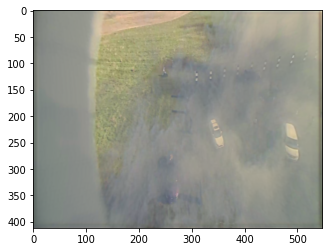

In [53]:
i = 0
for image_path in dry_run_images:
  i = i+1
  if i>5:
    break
  image = cv2.imread(image_path)
  img = tf.io.read_file(image_path)
  img = tf.io.decode_jpeg(img, channels = 3)

  if img.shape[1] > img.shape[0]:
      img = tf.image.resize(img, size = (548, 412), antialias = True)
  if img.shape[1] < img.shape[0]:
      img = tf.image.resize(img, size = (412, 548), antialias = True)

  img = img / 255
  img = tf.expand_dims(img, axis = 0)      # transform input image from 3D to 4D

  dehaze = net(img, training = False)

  image = dehaze[0]
  plt.imshow(image)
  image = tf.convert_to_tensor(
      image
  )
  image  = tf.image.convert_image_dtype(image, tf.float32)[tf.newaxis, ...]

  result = detector(image)

  result = {key:value.numpy() for key,value in result.items()}

  coords = filter_coords(result, 0.0)

  image_to_predicted_bb[image_path] = coords

In [47]:
root
im_height, im_width = 750, 1845

In [48]:
results = os.path.join(root, 'results_1')

Path(results).mkdir(parents=True, exist_ok=True)

for image in image_to_predicted_bb:
  filename = Path(image).stem
  new_file = os.path.join(results, f'{filename}.txt')
  coords = image_to_predicted_bb[image]
  try:
    os.remove(filename)
  except OSError:
    pass
  f = open(new_file, "w+")
  for coord in coords:
    ymin, xmin, ymax, xmax = coord[0]
    threshold = coord[1]
    format_string = f'vehicle {xmin*im_width} {ymin*im_height} {xmax*im_width} {ymax*im_height} {threshold}\n'
    f = open(new_file, "a+")
    f.write(format_string)
    f.close()